# Resultados para o artigo da disciplina de Hidrologia II

In [1]:
from hydrocomp.series import flow
import plotly.offline as plt_of
import pandas as pd

### Dados

In [2]:
# Obtenção dos dados de vazão usado a biblioteca hydrocomp.
stations = ['76100000', '76310000', '76380000', '76440000', '76460000', '76750000']

df_flow = flow.Flow(path_file=stations, source='ANA', consistence=1)
df_flow.data.head()

,76100000,76310000,76380000,76440000,76460000,76750000
Date,,,,,,
1940-04-01,NaN,NaN,45.6,NaN,NaN,NaN
1940-04-02,NaN,NaN,24.3,NaN,NaN,NaN
1940-04-03,NaN,NaN,15.6,NaN,NaN,NaN
1940-04-04,NaN,NaN,14.1,NaN,NaN,NaN
1940-04-05,NaN,NaN,11.2,NaN,NaN,NaN


### Gráficos

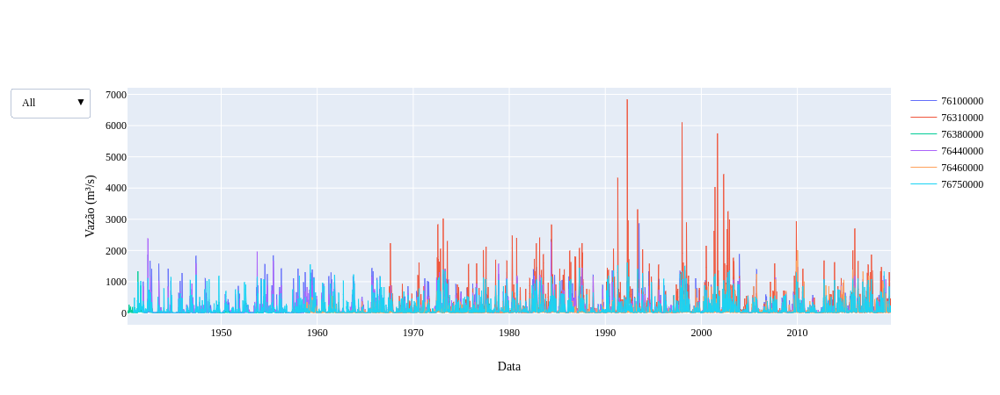

In [4]:
fig, data = df_flow.plot_hydrogram('')
plt_of.iplot(fig)

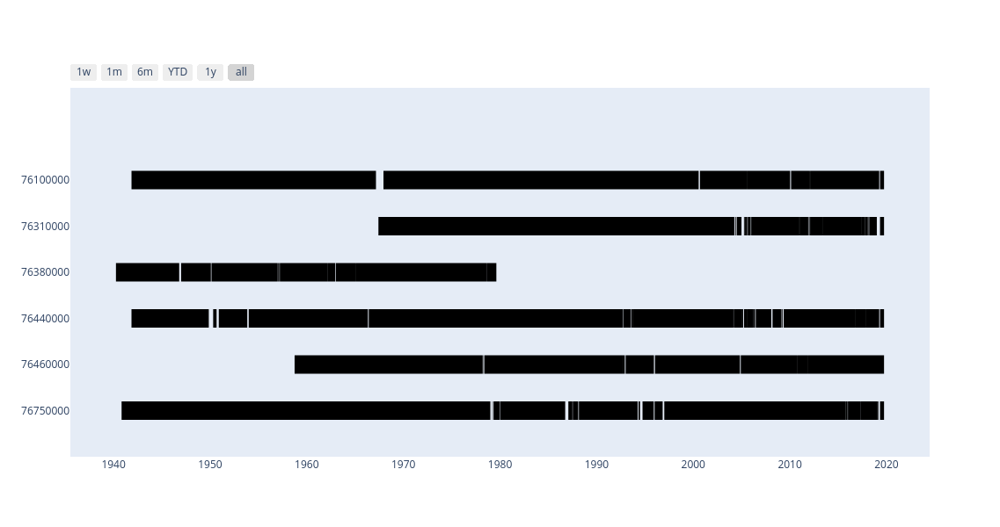

In [5]:
fig, data = df_flow.gantt('')
plt_of.iplot(fig)

In [6]:
# Definição do período de dados
df_flow.date(date_start='1/4/1968', date_end='31/12/1977')
df_flow.data.isnull().sum()

76100000    0
76310000    0
76380000    0
76440000    0
76460000    0
76750000    0
dtype: int64

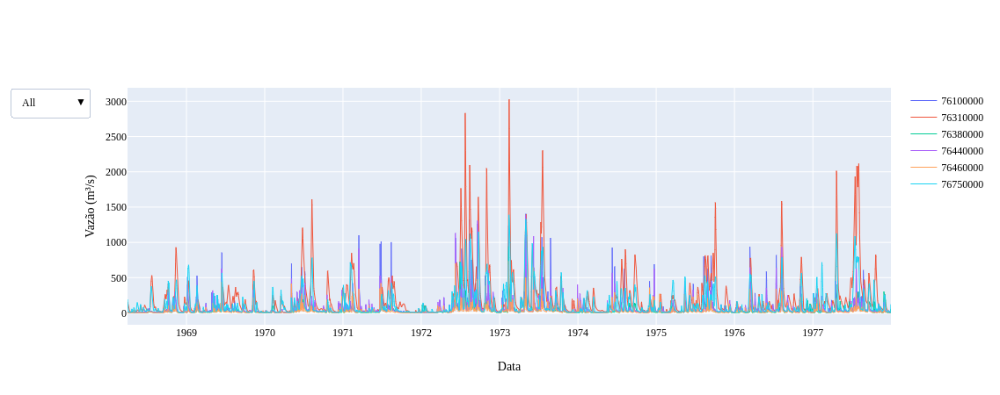

In [7]:
fig, data = df_flow.plot_hydrogram('')
plt_of.iplot(fig)

### Vazão máxima diaria

In [8]:
qmax = pd.DataFrame(df_flow.data.max(), columns=['qmax'])
qmax.index.names = ['Estacao']
qmax

,qmax
Estacao,
76100000,1402.53
76310000,3022.98
76380000,940.00
76440000,1382.00
76460000,732.30
76750000,1388.99


### Informações das bacias

In [9]:
df_inf = pd.read_csv('df_inf.csv', ';', header=0, dtype={'Estacao': str}).rename(columns={'Area de Drenagem': 'AD', 'Comprimento do maior rio': 'CR', 'Densidade de drenagem': 'DD', 'Inclinacao Media':'S'})
df_inf.index = df_inf['Estacao']
df_inf.drop('Estacao', axis=1, inplace=True)

In [12]:
df_inf = df_inf.drop('76800000', axis=0)

In [13]:
df_inf['Q'] = qmax['qmax'].divide(df_inf['AD'])
df_inf

,AD,CR,DD,S,Q
Estacao,,,,,
76100000,2939.69,95.581683,0.032514,0.091734,0.477101
76310000,12763.35,188.169869,0.014743,0.043672,0.236848
76380000,1919.07,55.063396,0.028693,0.047851,0.489821
76440000,2446.81,124.995047,0.051085,0.074900,0.564817
76460000,967.46,17.194706,0.017773,0.074319,0.756931
76750000,6324.20,150.717788,0.023832,0.061591,0.219631


## Cluster

In [14]:
import numpy as np
from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [15]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

In [16]:
features = ['AD', 'CR', 'DD', 'S', 'Q']
x = df_inf.loc[:, features].values
y = df_inf.index.values
x2 = StandardScaler().fit_transform(x)

### Dendrograma

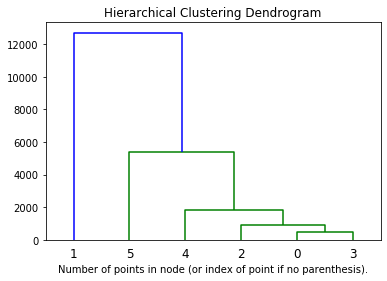

In [17]:
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(x)
plt.title('Hierarchical Clustering Dendrogram')
# plot the top three levels of the dendrogram
plot_dendrogram(model)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [18]:
pca = PCA(n_components='mle')
principalComponents = pca.inverse_transform(pca.fit_transform(x))
principalDf = pd.DataFrame(data = principalComponents, index=y)

In [19]:
principalDf.columns = ['AD', 'CR', 'DD', 'S', 'Q']
principalDf

,AD,CR,DD,S,Q
76100000,2939.69,95.581689,0.032830,0.070248,0.478158
76310000,12763.35,188.169869,0.013092,0.045818,0.236798
76380000,1919.07,55.063394,0.022647,0.063801,0.489233
76440000,2446.81,124.995045,0.049297,0.084295,0.564411
76460000,967.46,17.194705,0.021855,0.070557,0.756979
76750000,6324.20,150.717787,0.028919,0.059349,0.219570


### Método do Cotovelo

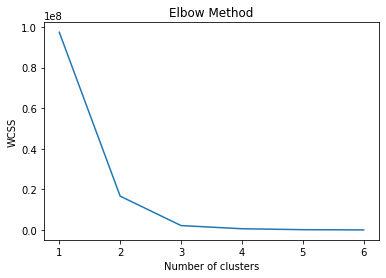

In [22]:
wcss = []
for i in range(1, 7):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=1, random_state=0)
    kmeans.fit(x)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 7), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

Atráves do método do cotovelo, recomenda-se usar 2 cluster; 

### Centro dos Cluster

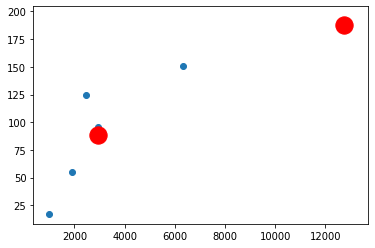

In [23]:
kmeans = KMeans(n_clusters=2, init='k-means++', max_iter=300, n_init=1, random_state=0)
pred_y = kmeans.fit_predict(x)
plt.scatter(x[:,0], x[:,1])
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='red')
plt.show()

O cluster01 tem os seguintes estações: 
 - 76100000
 - 76380000 
 - 76440000
 - 76460000 
 - 76750000

## Development of Regional Flood Frequency Formulas for the Region

### Relationship between $\frac{Q_t}{Q_m}$ and Return Period T

- Para definir qual distribuição se adequa melhor aos dados, como vamos usar a distribuição GEV, não precisamos fazer essa verificação;

#### Parâmetros GEV - MomentosL

In [24]:
from lmoments3 import distr

In [26]:
paras = distr.gev.lmom_fit(principalDf['Q'])
paras

OrderedDict([('c', 0.18297753049291346),
             ('loc', 0.3714330782734111),
             ('scale', 0.20423239462470338)])

Parêmtros estimados para a distribuição GEV utilizando o métodos dos momentos L:
- $\kappa = 0.1829$
- $\beta = 0.3714$
- $\alpha = 0.2042$

### Relationship between Index Flood and Catchment Characteristics

In [27]:
cluster01 = principalDf.loc[['76100000', '76380000', '76440000', '76460000', '76750000'], :]

In [28]:
cluster01

,AD,CR,DD,S,Q
76100000,2939.69,95.581689,0.032830,0.070248,0.219570
76380000,1919.07,55.063394,0.022647,0.063801,0.478158
76440000,2446.81,124.995045,0.049297,0.084295,0.489233
76460000,967.46,17.194705,0.021855,0.070557,0.564411
76750000,6324.20,150.717787,0.028919,0.059349,0.756979


In [29]:
boxplot = cluster01.copy()
boxplot['AD'] = boxplot['AD']/10000
boxplot['CR'] = boxplot['CR']/1000

In [30]:
boxplot

,AD,CR,DD,S,Q
76100000,0.293969,0.095582,0.032830,0.070248,0.219570
76380000,0.191907,0.055063,0.022647,0.063801,0.478158
76440000,0.244681,0.124995,0.049297,0.084295,0.489233
76460000,0.096746,0.017195,0.021855,0.070557,0.564411
76750000,0.632420,0.150718,0.028919,0.059349,0.756979


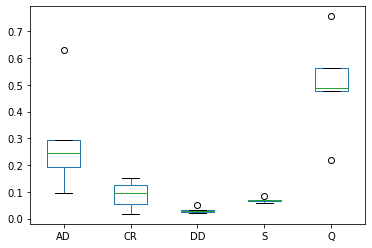

In [31]:
boxplot.boxplot(grid=False)

Boxplot para as variáveis do cluster01

In [32]:
for i in ['76100000', '76380000', '76440000', '76460000', '76750000']:
    df_flow.station = i
    max = df_flow.maximum()
    cluster01.at[i, 'Qm'] = max.peaks.mean().values[0]

In [33]:
cluster01

,AD,CR,DD,S,Q,Qm
76100000,2939.69,95.581689,0.032830,0.070248,0.219570,958.713900
76380000,1919.07,55.063394,0.022647,0.063801,0.478158,314.000000
76440000,2446.81,124.995045,0.049297,0.084295,0.489233,811.402000
76460000,967.46,17.194705,0.021855,0.070557,0.564411,413.950000
76750000,6324.20,150.717787,0.028919,0.059349,0.756979,757.367545


#### Modelos de regressões regionais

In [34]:
import statsmodels.formula.api as smf

#Modelo 1
results01 = smf.ols('np.log(Qm) ~ np.log(AD+S+DD+CR)', cluster01).fit()
print(results01.summary())

                            OLS Regression Results                            
Dep. Variable:             np.log(Qm)   R-squared:                       0.390
Model:                            OLS   Adj. R-squared:                  0.187
Method:                 Least Squares   F-statistic:                     1.921
Date:                Wed, 11 Dec 2019   Prob (F-statistic):              0.260
Time:                        15:51:22   Log-Likelihood:                -1.6311
No. Observations:                   5   AIC:                             7.262
Df Residuals:                       3   BIC:                             6.481
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept               

/home/clebsonpy/Documents/Projetos/PPGRHS_Disciplinas/venv/lib/python3.6/site-packages/statsmodels/stats/stattools.py:71: ValueWarning:

omni_normtest is not valid with less than 8 observations; 5 samples were given.



A regressão multipla entre média ou mediana anual de cheia com as variáveis independenete de característica bacia

In [35]:
print('Predicted values: ', np.exp(results01.predict()))
print('R2: ', results01.rsquared)

Predicted values:  [650.98862566 538.97646985 605.3270154  397.16891648 907.82222135]
R2:  0.39032663908267207


In [36]:
# Modelo 2
results02 = smf.ols('np.log(Qm) ~ np.log(AD)', cluster01).fit()
print(results02.summary())

                            OLS Regression Results                            
Dep. Variable:             np.log(Qm)   R-squared:                       0.382
Model:                            OLS   Adj. R-squared:                  0.177
Method:                 Least Squares   F-statistic:                     1.858
Date:                Wed, 11 Dec 2019   Prob (F-statistic):              0.266
Time:                        15:51:32   Log-Likelihood:                -1.6632
No. Observations:                   5   AIC:                             7.326
Df Residuals:                       3   BIC:                             6.545
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.9953      2.501      1.198      0.3

/home/clebsonpy/Documents/Projetos/PPGRHS_Disciplinas/venv/lib/python3.6/site-packages/statsmodels/stats/stattools.py:71: ValueWarning:

omni_normtest is not valid with less than 8 observations; 5 samples were given.



O relacionamento entre média anual de cheia e área da bacia

In [37]:
print('Predicted values: ', np.exp(results02.predict()))
print('R2: ', results02.rsquared)

Predicted values:  [650.12688617 539.81930126 600.13546558 400.46103928 907.93179638]
R2:  0.382443670486324


Os valores de R2 para os modelos 1 e 2, são muitos próximos, sendo assim, foi utilizado o modelos 2.

In [38]:
np.exp(2.9953)

19.991356397255213

$Qm = 19.9914*AD^{0.4979}$

In [39]:
# Função da regressão regional
def regional(AD):
    return np.exp(2.9953) * AD**0.436

In [40]:
regional(2939.696)

650.1628004635662

#### Distribuição de Reginalização

$Qmax = Dist * Qm$

In [41]:
# Função da distribuição regional
def dist_regional(T, AD):
    return regional(AD) * distr.gev.ppf((1-1/T), **paras)

In [42]:
dist_regional(100, 1500)

488.0453219742963

#### Distribuição Local para estação 76440000

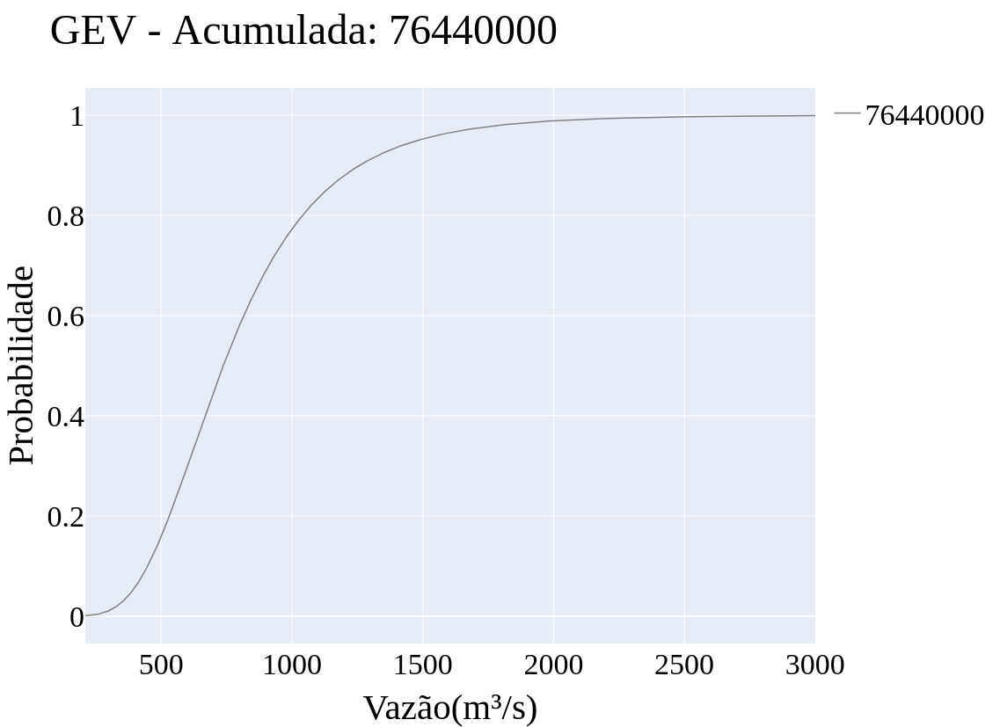

In [43]:
df_flow.station = '76440000'
max = df_flow.maximum()
data, fig = max.plot_distribution(title='76440000', estimador='MML', type_function='cumulative')
plt_of.iplot(fig)

In [44]:
print("kappa: {}\nbeta: {}\nalpha: {}$".format(max.dist_gev.shape, max.dist_gev.loc, max.dist_gev.scale))

kappa: -0.09024224983362776
beta: 645.6750454431248
alpha: 245.647461389282$


In [45]:
mag_obs = max.dist_gev.values(p=[0.5, 0.9, 0.95, 0.98])

In [46]:
mag_obs

[737.2134838737726, 1258.6032231778931, 1482.4334391834486, 1794.6111412247838]

In [47]:
mag_est = []
for i in [2, 10, 20, 50]:
    mag_est.append(dist_regional(i, 2446.81))

In [48]:
mag_est

[266.37328440341287, 449.0214255240407, 503.7873231417305, 564.7645713497056]